## Initial setup
This analysis using ema is based on the work of Enayat A. Moallemi created on 22 May 2018 at the Fraunhofer ISI, Karlsruhe. In that instance, the analysis was done for the MATISSE model.
This notebook present a second stage on a SA and UA. It is a variance-based approach using the SOBOL. 
For this, The EMA workbench is used with SALib SOBOL sampler and SALib analyse methods.
    

In [80]:

'''
by Angela M. Rojas A. <angelara@student.unimelb.edu.au>

Created on February 2020

'''
import sys
import os

sys.path.append(r'C:\Users\angel\Documents\GitHub\gr4sp\experiments\EMAworkbench')

sys.path.append(r'C:\Users\angel\Documents\GitHub\gr4sp\experiments')

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import matplotlib.cm as cm
import seaborn as sns
import os
import glob
import numpy as np
import pandas as pd
import os
import glob

includePlots = True

## SOBOL visualization functions
source code from [here](https://pynetlogo.readthedocs.io/en/latest/_docs/SALib_ipyparallel.html) code-block 25

In [2]:
import itertools
from math import pi


def normalize(x, xmin, xmax):
    return (x-xmin)/(xmax-xmin)


def plot_circles(ax, locs, names, max_s, stats, smax, smin, fc, ec, lw,
                 zorder):
    s = np.asarray([stats[name] for name in names])
    s = 0.01 + max_s * np.sqrt(normalize(s, smin, smax))

    fill = True
    for loc, name, si in zip(locs, names, s):
        if fc=='w':
            fill=False
        else:
            ec='none'

        x = np.cos(loc)
        y = np.sin(loc)

        circle = plt.Circle((x,y), radius=si, ec=ec, fc=fc, transform=ax.transData._b,
                            zorder=zorder, lw=lw, fill=True)
        ax.add_artist(circle)


def filter(sobol_indices, names, locs, criterion, threshold):
    if criterion in ['ST', 'S1', 'S2']:
        data = sobol_indices[criterion]
        data = np.abs(data)
        data = data.flatten() # flatten in case of S2
        # TODO:: remove nans

        filtered = ([(name, locs[i]) for i, name in enumerate(names) if
                     data[i]>threshold])
        filtered_names, filtered_locs = zip(*filtered)
    elif criterion in ['ST_conf', 'S1_conf', 'S2_conf']:
        raise NotImplementedError
    else:
        raise ValueError('unknown value for criterion')

    return filtered_names, filtered_locs


def plot_sobol_indices(sobol_indices, uncertainties, criterion='ST', threshold=0.01):
    '''plot sobol indices on a radial plot

    Parameters
    ----------
    sobol_indices : dict
                    the return from SAlib
    criterion : {'ST', 'S1', 'S2', 'ST_conf', 'S1_conf', 'S2_conf'}, optional
    threshold : float
                only visualize variables with criterion larger than cutoff

    '''
    max_linewidth_s2 = 15 #25*1.8
    max_s_radius = 0.3

    # prepare data
    # use the absolute values of all the indices
    #sobol_indices = {key:np.abs(stats) for key, stats in sobol_indices.items()}

    # dataframe with ST and S1
    sobol_stats = {key:sobol_indices[key] for key in ['ST', 'S1']}
    sobol_stats = pd.DataFrame(sobol_stats, index=uncertainties)

    smax = sobol_stats.max().max()
    smin = sobol_stats.min().min()

    # dataframe with s2
    s2 = pd.DataFrame(sobol_indices['S2'], index=uncertainties,
                      columns=uncertainties)
    s2[s2<0.0]=0. #Set negative values to 0 (artifact from small sample sizes)
    s2max = s2.max().max()
    s2min = s2.min().min()

    names = uncertainties
    n = len(names)
    ticklocs = np.linspace(0, 2*pi, n+1)
    locs = ticklocs[0:-1]

    filtered_names, filtered_locs = filter(sobol_indices, names, locs,
                                           criterion, threshold)

    # setup figure
    fig = plt.figure()
    ax = fig.add_subplot(111, polar=True)
    ax.grid(False)
    ax.spines['polar'].set_visible(False)
    ax.set_xticks(ticklocs)

    ax.set_xticklabels(names)
    ax.set_yticklabels([])
    ax.set_ylim(top=1.4)
    legend(ax)

    # plot ST
    plot_circles(ax, filtered_locs, filtered_names, max_s_radius,
                 sobol_stats['ST'], smax, smin, 'w', 'k', 1, 9)

    # plot S1
    plot_circles(ax, filtered_locs, filtered_names, max_s_radius,
                 sobol_stats['S1'], smax, smin, 'k', 'k', 1, 10)

    # plot S2
    for name1, name2 in itertools.combinations(zip(filtered_names, filtered_locs), 2):
        name1, loc1 = name1
        name2, loc2 = name2

        weight = s2.loc[name1, name2]
        lw = 0.5+max_linewidth_s2*normalize(weight, s2min, s2max)
        ax.plot([loc1, loc2], [1,1], c='darkgray', lw=lw, zorder=1)

    return fig


from matplotlib.legend_handler import HandlerPatch
class HandlerCircle(HandlerPatch):
    def create_artists(self, legend, orig_handle,
                       xdescent, ydescent, width, height, fontsize, trans):
        center = 0.5 * width - 0.5 * xdescent, 0.5 * height - 0.5 * ydescent
        p = plt.Circle(xy=center, radius=orig_handle.radius)
        self.update_prop(p, orig_handle, legend)
        p.set_transform(trans)
        return [p]

def legend(ax):
    some_identifiers = [plt.Circle((0,0), radius=5, color='k', fill=False, lw=1),
                        plt.Circle((0,0), radius=5, color='k', fill=True),
                        plt.Line2D([0,0.5], [0,0.5], lw=8, color='darkgray')]
    ax.legend(some_identifiers, ['ST', 'S1', 'S2'],
              loc='lower center', bbox_to_anchor=(1, 1), borderaxespad=0.1, mode='expand',
              handler_map={plt.Circle: HandlerCircle()})

## Load the results
These results are a tuple of one data frame with the changes on each input variable, and a dictionary with the outputs. 

In [3]:
from ema_workbench import load_results

#results = load_results(r'C:/Users/angel/Documents/GitHub/gr4sp/experiments/simulationData/gr4sp_SOBOL2020ABY-Dec-23.tar.gz')
results = load_results(r'C:/Users/angel/Documents/GitHub/gr4sp/experiments/simulationData/gr4sp_SOBOL2021-Feb-03.tar.gz')


In [4]:
experiments, outcomes = results
outcomes['PrimarySpot-WholesalePriceYear'] = outcomes['wholesalePriceYear']
# Create a temporary copy of dictionary, with Outcomes Year
outcomesYear = dict(outcomes)

keysToRemove = [] 
# Iterate over the temporary dictionary and delete corresponding key from original dictionary
for (key, value) in outcomesYear.items() :
    if 'Month' in key:
        keysToRemove.append(key)
        
for k in keysToRemove:        
    del outcomesYear[k]   
    
        

In [5]:
experiments.describe()

,annualCpi,annualInflation,consumption,domesticConsumptionPercentage,energyEfficiency,generationRolloutPeriod,generatorRetirement,importPriceFactor,includePublicallyAnnouncedGen,learningCurve,...,priceChangePercentageBrownCoal,priceChangePercentageOcgt,priceChangePercentageWater,priceChangePercentageWind,rooftopPV,scheduleMinCapMarketGen,semiScheduleGenSpotMarket,semiScheduleMinCapMarketGen,solarUptake,wholesaleTariffContribution
count,126000.000000,126000.000000,126000.000000,126000.000000,126000.000000,126000.000000,126000.000000,126000.000000,126000.000000,126000.000000,...,126000.000000,126000.000000,126000.000000,126000.000000,126000.000000,126000.000000,126000.000000,126000.000000,126000.000000,126000.000000
mean,3.000238,2.998810,1.999048,34.990000,1.000714,5.497143,-0.001429,-0.007143,0.500000,7.497143,...,-0.018333,0.006190,0.005000,0.000714,5.999524,150.541905,8.998333,150.370476,2.001429,27.503810
std,1.415313,1.415313,1.414556,8.939456,0.816645,2.872126,3.161913,29.152702,0.500002,4.609583,...,29.153567,29.154507,29.151743,29.152674,0.816208,86.593375,0.816061,86.599359,1.414892,10.387143
min,1.000000,1.000000,0.000000,20.000000,0.000000,1.000000,-5.000000,-50.000000,0.000000,0.000000,...,-50.000000,-50.000000,-50.000000,-50.000000,5.000000,1.000000,8.000000,1.000000,0.000000,10.000000
25%,2.000000,2.000000,1.000000,27.000000,0.000000,3.000000,-3.000000,-25.000000,0.000000,3.750000,...,-25.000000,-25.000000,-25.000000,-25.000000,5.000000,75.750000,8.000000,75.750000,1.000000,18.750000
50%,3.000000,3.000000,2.000000,35.000000,1.000000,5.500000,0.000000,0.000000,0.500000,7.500000,...,0.000000,0.000000,0.000000,0.000000,6.000000,150.500000,9.000000,150.500000,2.000000,27.500000
75%,4.000000,4.000000,3.000000,43.000000,2.000000,8.000000,3.000000,25.000000,1.000000,11.250000,...,25.000000,25.000000,25.000000,25.000000,7.000000,225.250000,10.000000,225.250000,3.000000,36.250000
max,5.000000,5.000000,4.000000,50.000000,2.000000,10.000000,5.000000,50.000000,1.000000,15.000000,...,50.000000,50.000000,50.000000,50.000000,7.000000,300.000000,10.000000,300.000000,4.000000,45.000000


## Uncertainties/levers

The outcomes are shown per year. Though another analysis can be done for monthly outcomes. 

In [90]:
outcomes_to_show = ['consumptionYear', 'tariffsYear', 'PrimarySpot-WholesalePriceYear', 'GHGYear', 
                    'primarySpotProductionYear', 'secondarySpotProductionYear', 
                    'offSpotProductionYear', 'renewableContributionYear', 'rooftopPVProductionYear', 
                    'coalProductionYear', 'waterProductionYear', 'windProductionYear', 'gasProductionYear', 
                    'solarProductionYear', 'primaryUnmetDemandMwh', 
                    'primaryUnmetDemandHours', 'primaryUnmetDemandDays', 'primaryMaxUnmetDemandMwhPerHour', 
                    'secondaryUnmetDemandMwh', 'secondaryUnmetDemandHours', 'secondaryUnmetDemandDays', 
                    'secondaryMaxUnmetDemandMwhPerHour']
outcomes_to_show = ['GHGYear', 'renewableContributionYear', 'wholesalePriceYear', 'tariffsYear']
titles_ooi = {'GHGYear': 'GHGE', 'renewableContributionYear':'Renewable Energy Contribution', 
              'wholesalePriceYear': 'Wholesale Prices', 'tariffsYear':'Tariffs'  }


# 23 levers/uncertainties selected after EET (last test July 2020)
# 25 uncertainties selected aftet EET including change on domestic demand and unmet demand output (August 2020)
# 26 uncertainties selected after EET for changes afterBaseYear(Dec 2020)
uncertainties = experiments.columns[:-3]

#from startYear
startYear = 2019
startYearShift = (startYear - 1998)
#startYearShift = (startYear - 1997) * 12
time = outcomes['TIMEYear'][0, startYearShift:]
#index = pd.to_datetime(time, format = '%Y-%m-%d')
index = pd.to_datetime(time, format = '%Y')

In [91]:
for n in uncertainties:
    var = experiments[n]
    val = np.unique(var)
    print("{}: {}".format(n,val))

annualCpi: [1. 2. 3. 4. 5.]
annualInflation: [1. 2. 3. 4. 5.]
consumption: [0. 1. 2. 3. 4.]
domesticConsumptionPercentage: [20. 21. 22. 23. 24. 25. 26. 27. 28. 29. 30. 31. 32. 33. 34. 35. 36. 37.
 38. 39. 40. 41. 42. 43. 44. 45. 46. 47. 48. 49. 50.]
energyEfficiency: [0. 1. 2.]
generationRolloutPeriod: [ 1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]
generatorRetirement: [-5. -4. -3. -2. -1.  0.  1.  2.  3.  4.  5.]
importPriceFactor: [-50. -49. -48. -47. -46. -45. -44. -43. -42. -41. -40. -39. -38. -37.
 -36. -35. -34. -33. -32. -31. -30. -29. -28. -27. -26. -25. -24. -23.
 -22. -21. -20. -19. -18. -17. -16. -15. -14. -13. -12. -11. -10.  -9.
  -8.  -7.  -6.  -5.  -4.  -3.  -2.  -1.   0.   1.   2.   3.   4.   5.
   6.   7.   8.   9.  10.  11.  12.  13.  14.  15.  16.  17.  18.  19.
  20.  21.  22.  23.  24.  25.  26.  27.  28.  29.  30.  31.  32.  33.
  34.  35.  36.  37.  38.  39.  40.  41.  42.  43.  44.  45.  46.  47.
  48.  49.  50.]
includePublicallyAnnouncedGen: [0. 1.]
learningCurve: 

## SOBOL
To obtain the SALib results for each input for the sobol sensitivity indices (S1, S2, and ST)

In [92]:
from gr4spModelSOBOL import getModelAFterBaseYear
from ema_workbench.em_framework.salib_samplers import get_SALib_problem
from ema_workbench.em_framework.samplers import determine_parameters
from EMAworkbench.ema_workbench import (IntegerParameter, RealParameter, CategoricalParameter, BooleanParameter)

model = getModelAFterBaseYear()
uncertaintyCategories = determine_parameters(model, 'uncertainties', union=False) 
problem = get_SALib_problem(uncertaintyCategories)

In [126]:
def isclose(a, b, rel_tol=1e-09):
    return abs(a-b) <= rel_tol 

from SALib.analyze import sobol

def compute_sobol(sampled_outcomes, ooi):

    sobol_stats_years_ooi = {}
    s1_years_ooi = {}
    s1_conf_years_ooi = {}
    st_years_ooi = {}
    st_conf_years_ooi = {}
    s2_years_ooi = {}
    s2_conf_years_ooi = {}
    num_uncertainties = len(uncertainties)
    print(num_uncertainties)

    print(ooi)
    sobol_stats_years = pd.DataFrame([],columns=uncertainties)
    s1_years = pd.DataFrame([],columns=uncertainties)
    s1_conf_years = pd.DataFrame([],columns=uncertainties)
    st_years = pd.DataFrame([],columns=uncertainties)
    st_conf_years = pd.DataFrame([],columns=uncertainties)
    s2_years = {}
    s2_conf_years = {}
    for t in range(startYearShift, startYearShift + len(time)):
        dataY = sampled_outcomes[:, t]
        #change num_uncertainties = p to do the analysis with p levels
        stdY = dataY.std()
        print("{} - std: {}".format(startYear+t-startYearShift, stdY ) )

        if isclose(stdY, 0.0, rel_tol=1e-9):
            sobol_indices = {}
            sobol_indices['ST'] = np.zeros( num_uncertainties )
            sobol_indices['ST_conf'] = np.zeros( num_uncertainties )
            sobol_indices['S1'] = np.zeros( num_uncertainties )
            sobol_indices['S1_conf'] = np.zeros( num_uncertainties )
            sobol_indices['S2'] = np.zeros( (num_uncertainties, num_uncertainties) )
            sobol_indices['S2_conf'] = np.zeros( (num_uncertainties, num_uncertainties) )
        else:
            sobol_indices = sobol.analyze(problem, dataY)

        sobol_stats = {key: sobol_indices[key] for key in ['ST', 'ST_conf', 'S1',
                                                       'S1_conf']}

        sobol_stats = pd.DataFrame(sobol_stats, index=uncertainties)
        sobol_stats.sort_values(by='ST', ascending=False)
        s1 = pd.DataFrame([sobol_indices['S1']], columns=uncertainties)
        s1_conf = pd.DataFrame([sobol_indices['S1_conf']], columns=uncertainties)
        st = pd.DataFrame([sobol_indices['ST']], columns=uncertainties)
        st_conf = pd.DataFrame([sobol_indices['ST_conf']], columns=uncertainties)
        s2 = pd.DataFrame(sobol_indices['S2'], index=uncertainties, columns=uncertainties)
        s2_conf = pd.DataFrame(sobol_indices['S2_conf'], columns=uncertainties)

        sobol_stats_years = sobol_stats_years.append(sobol_stats, sort=False)
        s1_years = s1_years.append(s1, sort=False)
        s1_conf_years = s1_conf_years.append(s1_conf, sort=False)
        st_years = st_years.append(st, sort=False)
        st_conf_years = st_conf_years.append(st_conf, sort=False)
        s2_years[startYear] = s2
        s2_conf_years[startYear+t] = s2_conf

    s1_years = s1_years.set_index(time)        
    s1_conf_years = s1_conf_years.set_index(time)
    st_years = st_years.set_index(time)
    st_conf_years = st_conf_years.set_index(time)


    sobol_stats_years_ooi[ooi] = sobol_stats_years
    s1_years_ooi[ooi] = s1_years
    s1_conf_years_ooi[ooi] = s1_conf_years
    st_years_ooi[ooi] = st_years
    st_conf_years_ooi[ooi] = st_conf_years
    s2_years_ooi[ooi] = s2_years
    s2_conf_years_ooi[ooi] = s2_conf_years
        
        
    s1_median_ooi = {}
    s1_max_val_ooi = {}
    s1_max_val_year_ooi = {}
    s1_conf_median_ooi = {}
    s1_conf_max_val_ooi = {}
    s2_median_ooi = {}
    s2_max_val_ooi = {}
    s2_conf_median_ooi = {}
    s2_conf_max_val_ooi = {}
    st_median_ooi = {}
    st_max_val_ooi = {}
    st_max_val_year_ooi = {}
    st_conf_median_ooi = {}
    st_conf_max_val_ooi = {}

    ntime = len(time)


    s1_median_ooi[ooi] = s1_years_ooi[ooi].median()    
    s1_max_val_ooi[ooi] = s1_years_ooi[ooi].max()
    
    st_median_ooi[ooi] = st_years_ooi[ooi].median()
    st_max_val_ooi[ooi] = st_years_ooi[ooi].max()

    
    return s1_median_ooi[ooi], s1_max_val_ooi[ooi], st_median_ooi[ooi], st_max_val_ooi[ooi]

    s1_max_val_year_ooi[ooi] = s1_years_ooi[ooi].idxmax()
    s1_conf_max_val_ooi[ooi] = pd.Series({ k: s1_conf_years_ooi[ooi].loc[v,k] for k, v in s1_max_val_year_ooi[ooi].items()})
    
    st_max_val_year_ooi[ooi] = st_years_ooi[ooi].idxmax()
    st_conf_median_ooi[ooi] = st_conf_years_ooi[ooi].median()
    st_conf_max_val_ooi[ooi] = pd.Series({ k: st_conf_years_ooi[ooi].loc[v,k] for k, v in st_max_val_year_ooi[ooi].items()})

        #break



### Resample

In [127]:
experiments_idx = experiments.index
outcomes_sampling = {}
outcomes_sampling_idx = {}


s1_max_ooi = {}
s1_median_ooi = {}
st_max_ooi = {}
st_median_ooi = {}

for ooi in outcomes_to_show:
    print(ooi)
    s1_max = {}
    s1_median = {}
    st_max = {}
    st_median = {}
    for nsample in range(100,2101,100):
        nruns = nsample * (2*29 +2)
        print(f"{nsample} - {nruns}")
        outcomes_sampling_idx[nsample] = np.random.choice(experiments_idx,nruns, replace=False)
        outcomes_sampling[nsample] = np.take(outcomes[ooi],outcomes_sampling_idx[nsample],axis=0)
        s1_median[nsample], s1_max[nsample], st_median[nsample], st_max[nsample]  = compute_sobol(outcomes_sampling[nsample], ooi)
    s1_max_ooi[ooi] = s1_max
    s1_median_ooi[ooi] = s1_median
    st_max_ooi[ooi] = st_max
    st_median_ooi[ooi] = st_median

GHGYear
100 - 6000
29
GHGYear
2019 - std: 1.6347274167129378
2020 - std: 1.6674183650026684
2021 - std: 1.6004164116527337
2022 - std: 1.6564837901573244
2023 - std: 1.6805518976853255
2024 - std: 1.703648937106645
2025 - std: 1.695425995100633
2026 - std: 1.6656948034475814
2027 - std: 1.6312890760652372
2028 - std: 1.6023260661510217
2029 - std: 1.5665089558006018
2030 - std: 1.5336806564706333
2031 - std: 1.5028043667540611
2032 - std: 1.4724927616835293
2033 - std: 1.4295680762771479
2034 - std: 1.3902727638908448
2035 - std: 1.3560501907935258
2036 - std: 1.3342802952707595
2037 - std: 1.3147568551778708
2038 - std: 1.314055163504084
2039 - std: 1.3072791833072537
2040 - std: 1.2315076528148676
2041 - std: 1.2283128054137897
2042 - std: 1.211294960412464
2043 - std: 1.2751727991297086
2044 - std: 1.3263809029432103
2045 - std: 1.3956640743496913
2046 - std: 1.46713658327731
2047 - std: 1.4711480942693864
2048 - std: 1.4297588930605682
2049 - std: 1.3927677562588279
2050 - std: 1.3

2023 - std: 1.674753603120367
2024 - std: 1.700547153429453
2025 - std: 1.6924812354175218
2026 - std: 1.6626518727796091
2027 - std: 1.6294563025227724
2028 - std: 1.6005628205482894
2029 - std: 1.5638503532857793
2030 - std: 1.529791588747227
2031 - std: 1.4977509224955539
2032 - std: 1.466491229284411
2033 - std: 1.4246435227243188
2034 - std: 1.3859929927049643
2035 - std: 1.352238173735748
2036 - std: 1.331051116881097
2037 - std: 1.3107762269201937
2038 - std: 1.3099274028827204
2039 - std: 1.303245625912428
2040 - std: 1.2276196371829815
2041 - std: 1.2244479409587714
2042 - std: 1.2070071759804637
2043 - std: 1.2723662886905258
2044 - std: 1.3233859254225395
2045 - std: 1.3856632305082832
2046 - std: 1.459805476826892
2047 - std: 1.4614409975774065
2048 - std: 1.417668294827816
2049 - std: 1.3795222758889345
2050 - std: 1.3225608547603072
1000 - 60000
29
GHGYear
2019 - std: 1.6454431515412289
2020 - std: 1.674210882231612
2021 - std: 1.6009222521335156
2022 - std: 1.65658722713

2028 - std: 1.601674057218292
2029 - std: 1.5651805965489507
2030 - std: 1.531757656423832
2031 - std: 1.4998534549868794
2032 - std: 1.4687370961028527
2033 - std: 1.4271901118935726
2034 - std: 1.3883094767201982
2035 - std: 1.3543508439068332
2036 - std: 1.33300243874641
2037 - std: 1.3123919525651457
2038 - std: 1.3111492101007434
2039 - std: 1.3043855665732986
2040 - std: 1.228607946460436
2041 - std: 1.2251879241527548
2042 - std: 1.2076657408992204
2043 - std: 1.2722762443650004
2044 - std: 1.3234285817972593
2045 - std: 1.3874766886228607
2046 - std: 1.4614033287002346
2047 - std: 1.4626993674843032
2048 - std: 1.4171081475460297
2049 - std: 1.3790078836869444
2050 - std: 1.3218838110758724
1800 - 108000
29
GHGYear
2019 - std: 1.6407449132745937
2020 - std: 1.668258315324363
2021 - std: 1.593814949404817
2022 - std: 1.6476368862893895
2023 - std: 1.6732220956487178
2024 - std: 1.6995271380578454
2025 - std: 1.6925297397415053
2026 - std: 1.662995681193539
2027 - std: 1.62971269

2027 - std: 0.22735506601858793
2028 - std: 0.2254406401792924
2029 - std: 0.22256511571674809
2030 - std: 0.21897956428975981
2031 - std: 0.21419813750073244
2032 - std: 0.20923197925145975
2033 - std: 0.20387027562645665
2034 - std: 0.19834289804948854
2035 - std: 0.19353790540856594
2036 - std: 0.18935183789548957
2037 - std: 0.18597773089714884
2038 - std: 0.18270427990084592
2039 - std: 0.1791557518640448
2040 - std: 0.17707406359770858
2041 - std: 0.17701804410563515
2042 - std: 0.17297840777992632
2043 - std: 0.1820833264011338
2044 - std: 0.18835680150465303
2045 - std: 0.19608073672351126
2046 - std: 0.20932488521119744
2047 - std: 0.21042790041451542
2048 - std: 0.20543482483496517
2049 - std: 0.20142063852130826
2050 - std: 0.1922583939401214
500 - 30000
29
renewableContributionYear
2019 - std: 0.11343933111624756
2020 - std: 0.12832402313638083
2021 - std: 0.1612517568373174
2022 - std: 0.19071113252362773
2023 - std: 0.20597663340506886
2024 - std: 0.21964858100739384
2025

2020 - std: 0.12828958449379124
2021 - std: 0.16112404605644726
2022 - std: 0.1907578388951077
2023 - std: 0.20616623791022548
2024 - std: 0.21991002870225113
2025 - std: 0.22498578936196786
2026 - std: 0.22867854300898866
2027 - std: 0.22864753670718735
2028 - std: 0.22664365540696688
2029 - std: 0.22375873358068712
2030 - std: 0.22016925433586268
2031 - std: 0.2154649581673126
2032 - std: 0.2104644845018145
2033 - std: 0.20503987189273698
2034 - std: 0.19945493855736207
2035 - std: 0.19462822115828432
2036 - std: 0.19046397756485947
2037 - std: 0.18708432762577692
2038 - std: 0.18381004149842414
2039 - std: 0.18030429217248323
2040 - std: 0.17824677013868567
2041 - std: 0.17817289317716342
2042 - std: 0.17421101600359892
2043 - std: 0.18279533333718384
2044 - std: 0.18916582049301886
2045 - std: 0.19691784956988584
2046 - std: 0.20982490530006734
2047 - std: 0.21104415224854117
2048 - std: 0.20567573855444135
2049 - std: 0.20098886397303256
2050 - std: 0.19135932282719434
1300 - 7800

2045 - std: 0.1966243199438509
2046 - std: 0.20948629259521234
2047 - std: 0.21051491734856137
2048 - std: 0.204964354815277
2049 - std: 0.2005038121959837
2050 - std: 0.19112569001037832
2000 - 120000
29
renewableContributionYear
2019 - std: 0.11339704455405691
2020 - std: 0.1281584072560678
2021 - std: 0.1609300267361998
2022 - std: 0.19054652833064695
2023 - std: 0.20596494445384733
2024 - std: 0.2197816396209173
2025 - std: 0.2249473248354319
2026 - std: 0.2286225602756946
2027 - std: 0.228610126139455
2028 - std: 0.22663204935231152
2029 - std: 0.22378681943896672
2030 - std: 0.22017234091711635
2031 - std: 0.21543666746395979
2032 - std: 0.21037117511874154
2033 - std: 0.20491095043456
2034 - std: 0.19933487974945263
2035 - std: 0.19451532316202017
2036 - std: 0.1903891339132018
2037 - std: 0.187014215936092
2038 - std: 0.1837418749995613
2039 - std: 0.18021754932688577
2040 - std: 0.1781506048053034
2041 - std: 0.1781039118060642
2042 - std: 0.17413386888905175
2043 - std: 0.182

2046 - std: 799.4915550929089
2047 - std: 786.5008151233981
2048 - std: 828.5593304493128
2049 - std: 867.1859389742577
2050 - std: 544.2713094190639
700 - 42000
29
wholesalePriceYear
2019 - std: 68.97779226929238
2020 - std: 30.694530228299335
2021 - std: 24.800989451458936
2022 - std: 22.291850296673903
2023 - std: 21.360752552003206
2024 - std: 20.807911926584953
2025 - std: 23.833926639348878
2026 - std: 28.014473402691298
2027 - std: 38.38408767316497
2028 - std: 48.104203746941394
2029 - std: 57.633416175139715
2030 - std: 69.22917137441067
2031 - std: 83.67514409899529
2032 - std: 98.22476400192565
2033 - std: 93.17588486122064
2034 - std: 100.1322369132118
2035 - std: 110.9757183323537
2036 - std: 123.17728414894147
2037 - std: 133.36568513087576
2038 - std: 157.4651040787336
2039 - std: 210.0104146762173
2040 - std: 209.90575842265673
2041 - std: 228.45750018483645
2042 - std: 284.6303999433267
2043 - std: 608.0948462581267
2044 - std: 614.5043451857163
2045 - std: 732.4777769

2020 - std: 30.772081835959973
2021 - std: 24.753338003898126
2022 - std: 22.276537480052365
2023 - std: 21.405456897253348
2024 - std: 20.84649139405128
2025 - std: 23.721454809196498
2026 - std: 27.773802914194757
2027 - std: 38.10217685275427
2028 - std: 47.78591027318591
2029 - std: 57.36766471677821
2030 - std: 69.01297192823972
2031 - std: 83.82297385199323
2032 - std: 98.34941373822963
2033 - std: 92.25953911007166
2034 - std: 99.43199155085539
2035 - std: 110.0509803041324
2036 - std: 122.3008259113162
2037 - std: 132.3426485928481
2038 - std: 156.50101498453807
2039 - std: 209.376081004598
2040 - std: 209.0914684961422
2041 - std: 227.98638232337578
2042 - std: 286.83319033606995
2043 - std: 608.6171081637899
2044 - std: 613.7040337188693
2045 - std: 754.1907913842185
2046 - std: 796.6100812286702
2047 - std: 799.261839797172
2048 - std: 819.009884299691
2049 - std: 867.7923625213167
2050 - std: 540.1579732855552
1600 - 96000
29
wholesalePriceYear
2019 - std: 68.99549464665745

2026 - std: 7.627188424751434
2027 - std: 8.578484006407601
2028 - std: 11.060337227597598
2029 - std: 13.425016622852578
2030 - std: 15.704040003982369
2031 - std: 18.26384295185059
2032 - std: 21.89057695163259
2033 - std: 25.520782928941593
2034 - std: 23.584953322418475
2035 - std: 25.038717876334502
2036 - std: 26.824452145713458
2037 - std: 30.030202670233752
2038 - std: 31.94840725776924
2039 - std: 38.185887221390495
2040 - std: 48.176117344568006
2041 - std: 48.20486184956755
2042 - std: 51.33398194182699
2043 - std: 58.29255546157353
2044 - std: 93.37165795999196
2045 - std: 113.25559608872175
2046 - std: 128.97642342112752
2047 - std: 130.02847167446416
2048 - std: 132.13134253172268
2049 - std: 134.79221126576584
2050 - std: 143.4729303844558
300 - 18000
29
tariffsYear
2019 - std: 0.13577361639973218
2020 - std: 15.823704591472085
2021 - std: 9.026382956697953
2022 - std: 8.976332704397986
2023 - std: 7.555920455632145
2024 - std: 7.027143770212128
2025 - std: 6.58035490823

2032 - std: 21.63504089446681
2033 - std: 25.15639888866858
2034 - std: 22.5586777650775
2035 - std: 24.19398750438353
2036 - std: 26.220420012410358
2037 - std: 29.14200759022224
2038 - std: 31.246615212880013
2039 - std: 37.038000970320205
2040 - std: 46.16111849909385
2041 - std: 46.12527537310608
2042 - std: 49.37400151634445
2043 - std: 60.196562420030986
2044 - std: 98.10109135693068
2045 - std: 110.85393993064193
2046 - std: 128.29009492664338
2047 - std: 131.3374647017817
2048 - std: 130.7912935258249
2049 - std: 135.24999530765996
2050 - std: 143.45181092074196
1100 - 66000
29
tariffsYear
2019 - std: 0.1350242013030456
2020 - std: 15.798529480458859
2021 - std: 8.998267986847319
2022 - std: 9.061892744965832
2023 - std: 7.611124974726176
2024 - std: 7.070583742694056
2025 - std: 6.588792139525717
2026 - std: 7.269477098837769
2027 - std: 8.129177555553442
2028 - std: 10.471361307085184
2029 - std: 13.050654529013546
2030 - std: 15.54274802338183
2031 - std: 17.81867410578386
2

2038 - std: 30.802620690870384
2039 - std: 36.43033152152854
2040 - std: 45.670946635549576
2041 - std: 45.61761864916489
2042 - std: 48.78223485217215
2043 - std: 59.10060611104196
2044 - std: 96.38390822954977
2045 - std: 109.63328350497808
2046 - std: 127.04956837691729
2047 - std: 129.73447304578383
2048 - std: 129.93449353695885
2049 - std: 135.85942777232682
2050 - std: 143.8280126868397
1900 - 114000
29
tariffsYear
2019 - std: 0.1356451913968436
2020 - std: 15.770613716827107
2021 - std: 8.962156712763223
2022 - std: 9.056484397659569
2023 - std: 7.6028846575771665
2024 - std: 7.068014033034954
2025 - std: 6.606858612575763
2026 - std: 7.317443845371047
2027 - std: 8.178583845931929
2028 - std: 10.523075022065218
2029 - std: 13.025522749543425
2030 - std: 15.504309906205481
2031 - std: 17.825946168244997
2032 - std: 21.437676672429067
2033 - std: 24.893348207511522
2034 - std: 22.32795294237632
2035 - std: 24.107628445744304
2036 - std: 26.18109567268187
2037 - std: 28.998167386

### S1 Median

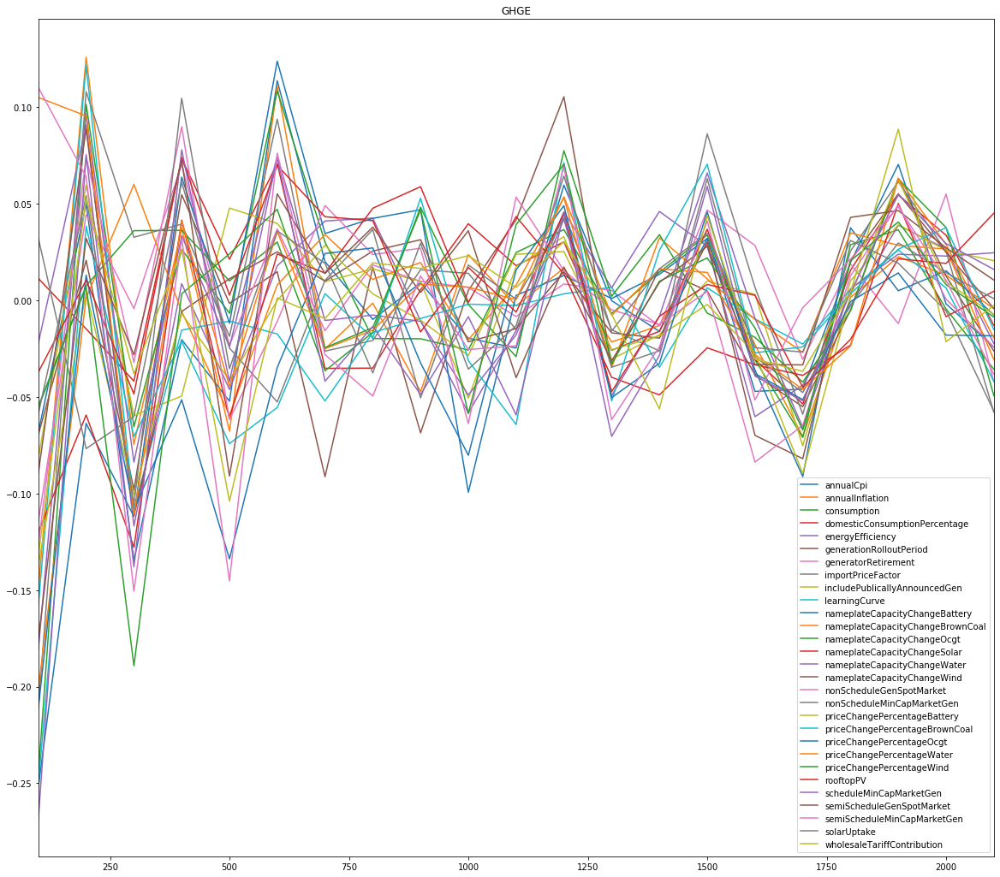

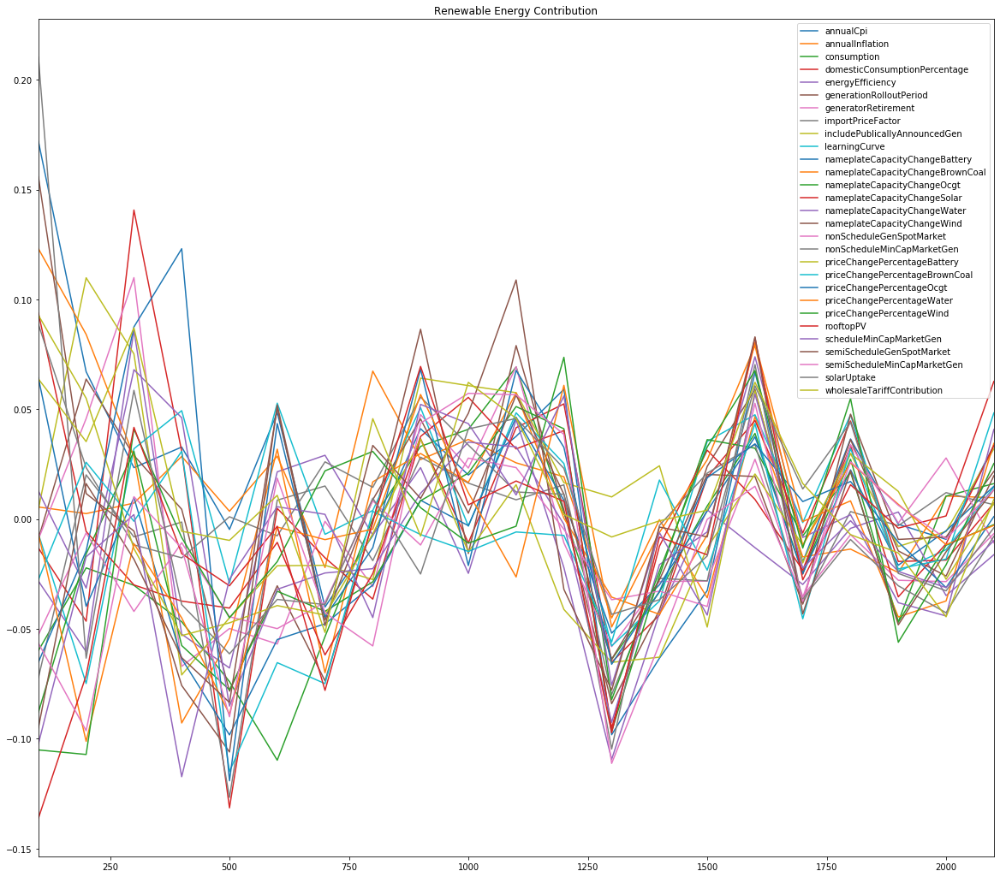

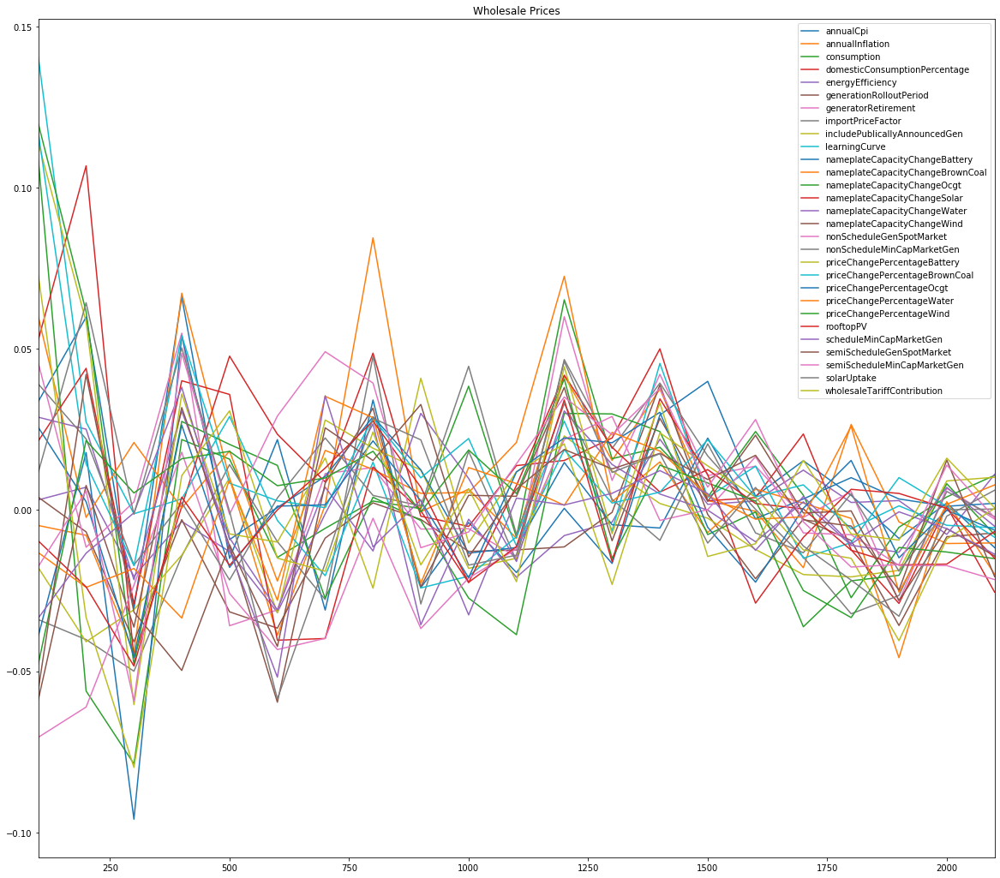

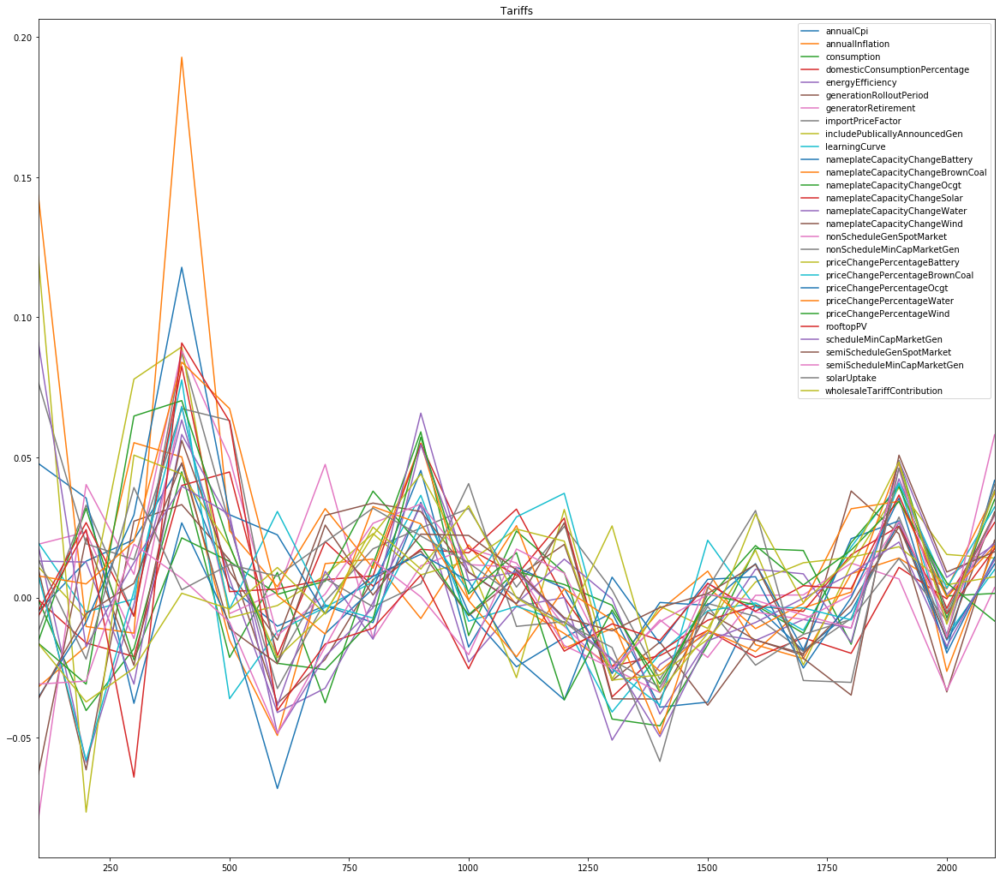

In [128]:

for ooi in outcomes_to_show:
    # multiple line plots
    s1_med_df = pd.DataFrame.from_dict(s1_median_ooi[ooi], orient='index')
   
    s1_med_df.plot(figsize=(20, 18),title=titles_ooi[ooi] )

    # show legend
    plt.legend()

    # show graph
    plt.show()

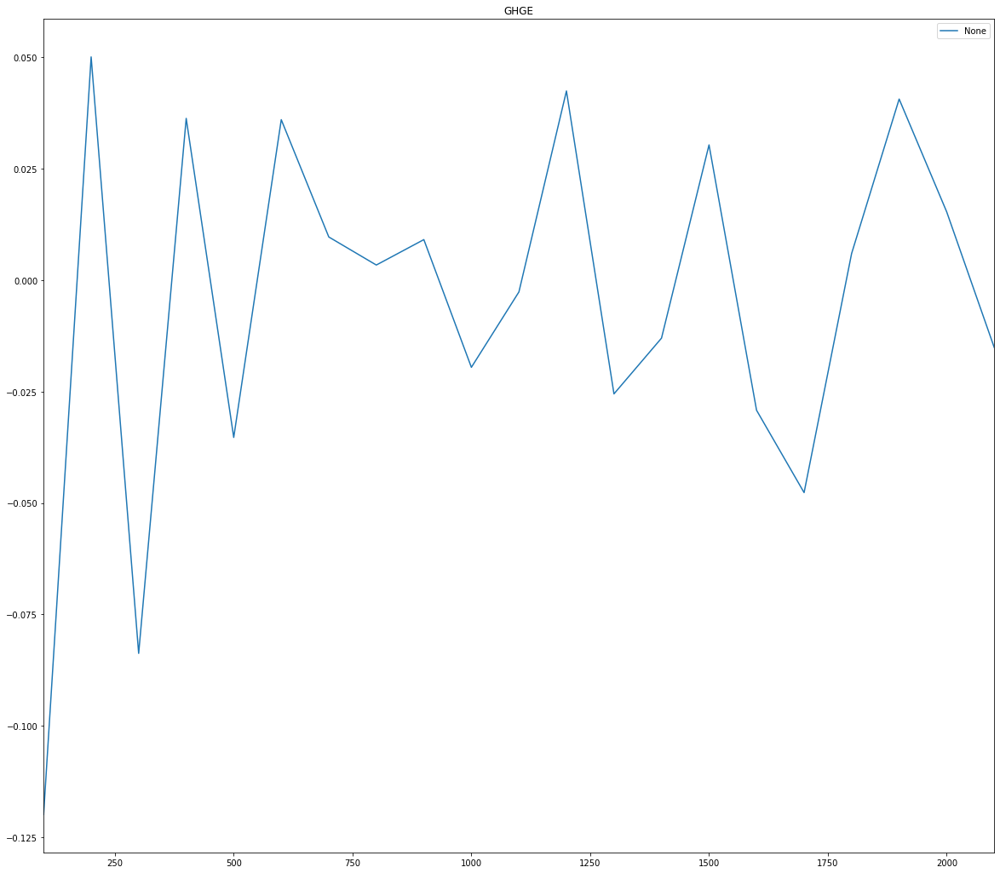

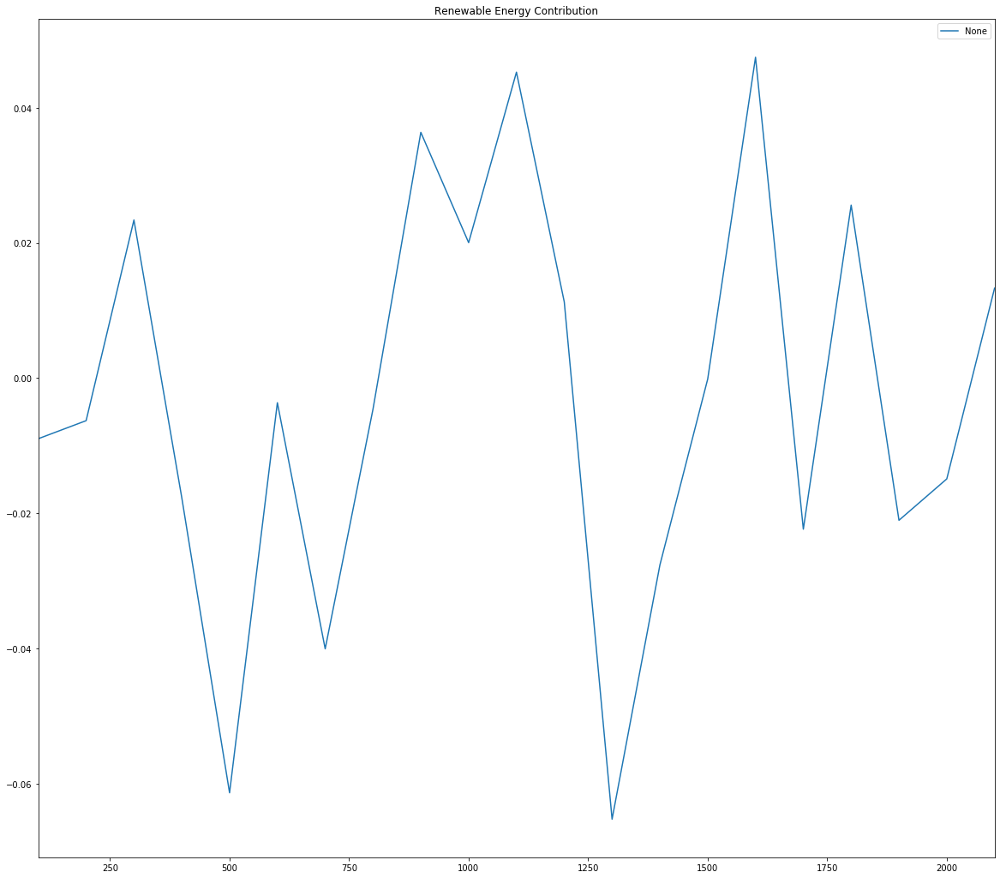

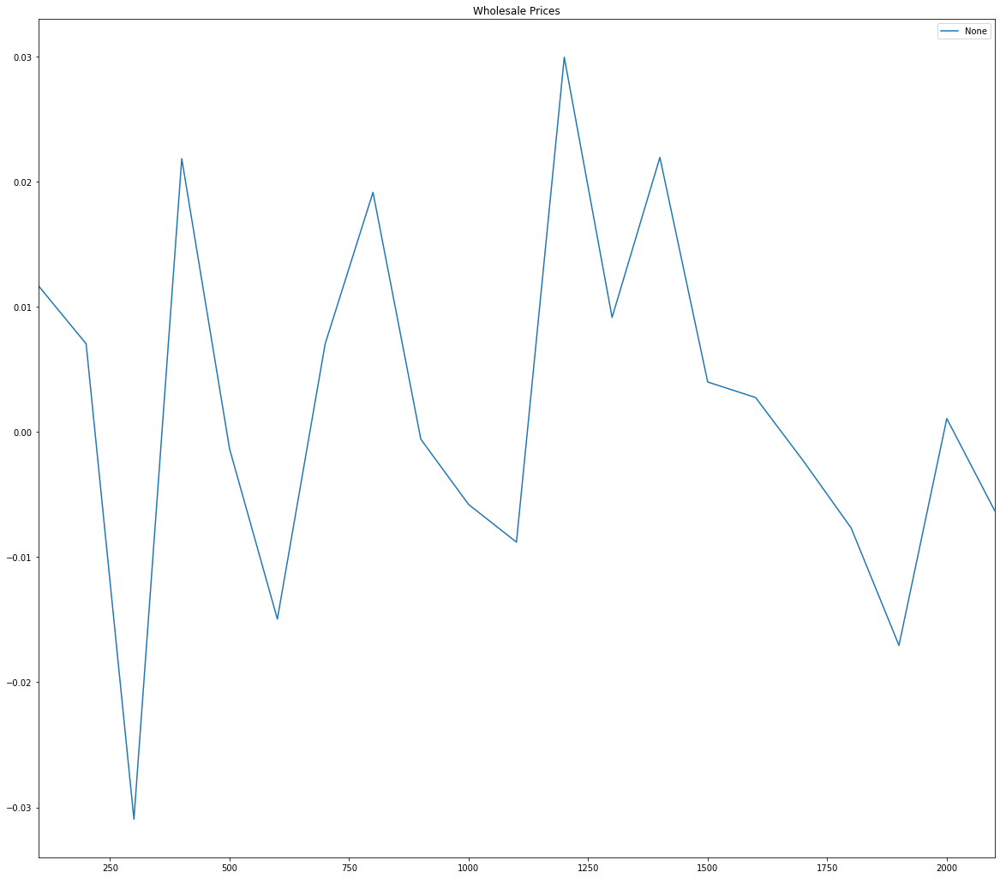

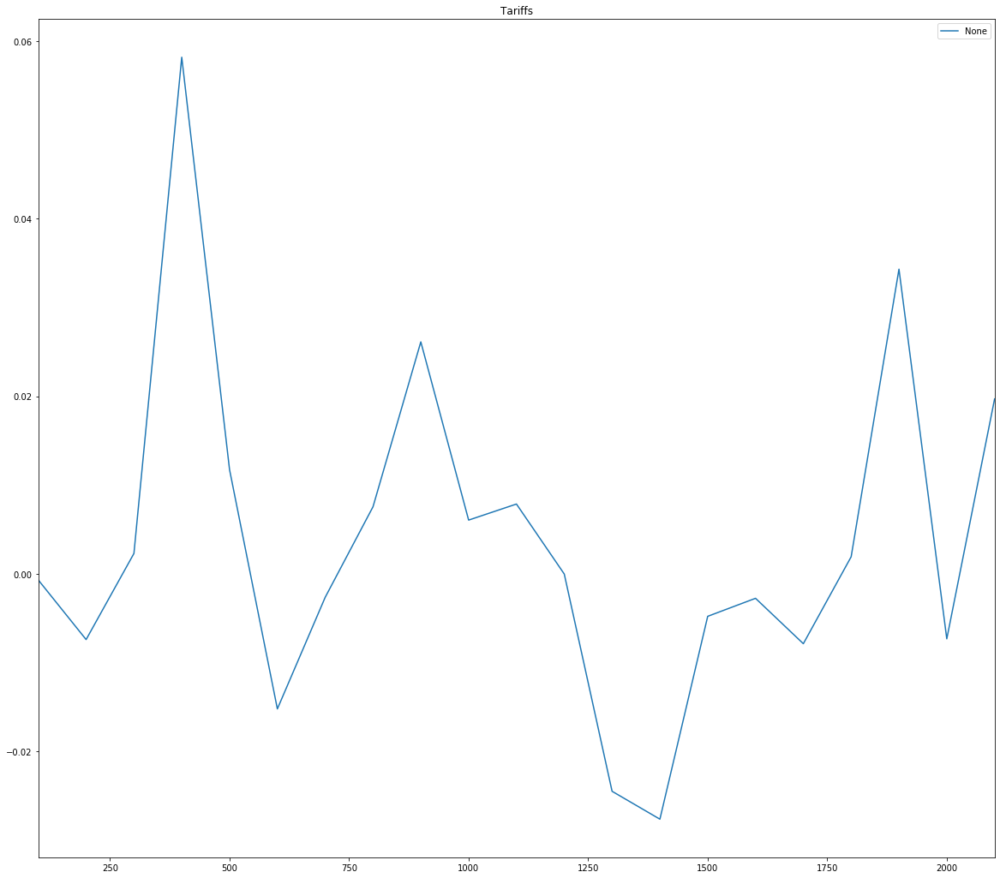

In [134]:

for ooi in outcomes_to_show:
    # multiple line plots
    s1_med_df = pd.DataFrame.from_dict(s1_median_ooi[ooi], orient='index')
   
    s1_med_df.median(axis=1).plot(figsize=(20, 18),title=titles_ooi[ooi] )

# show legend
    plt.legend()

# show graph
    plt.show()

### S1 Max

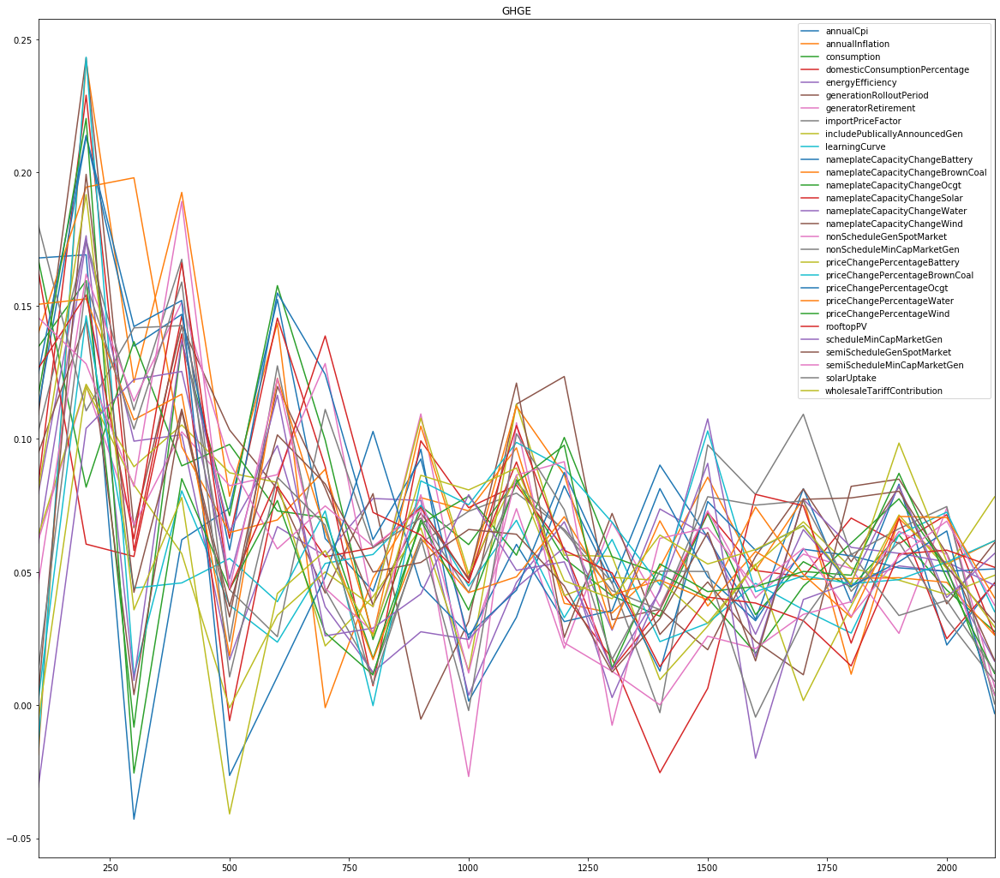

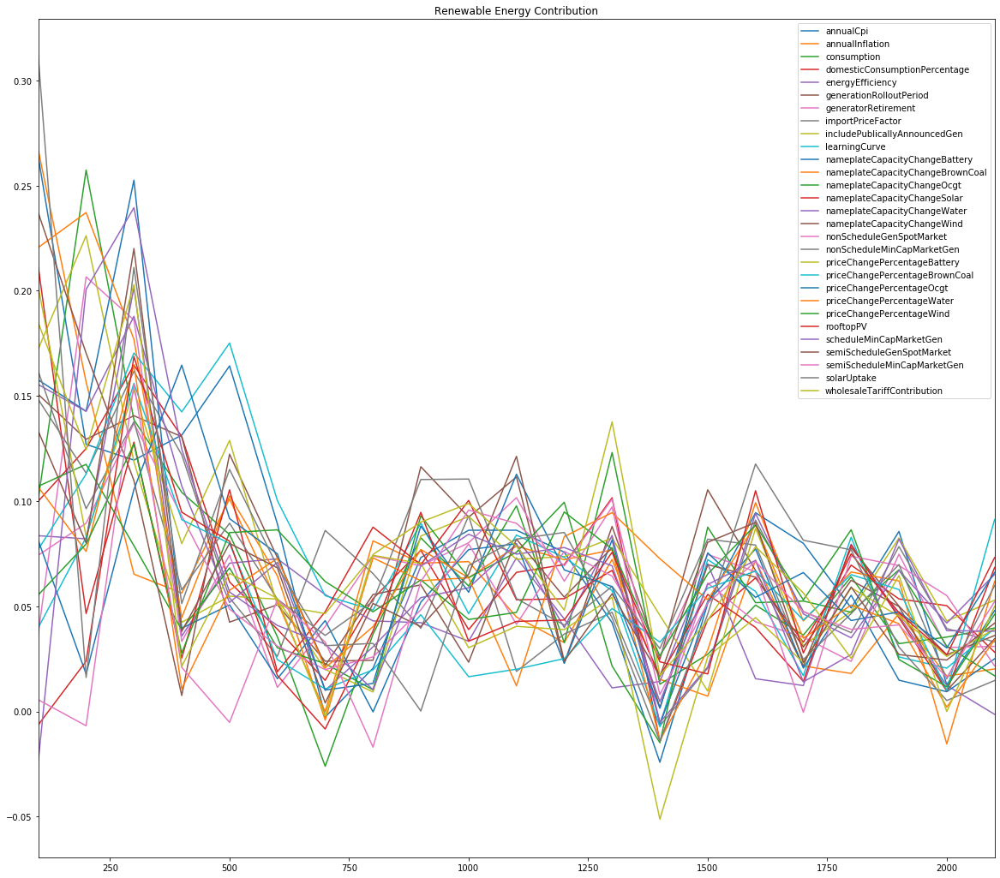

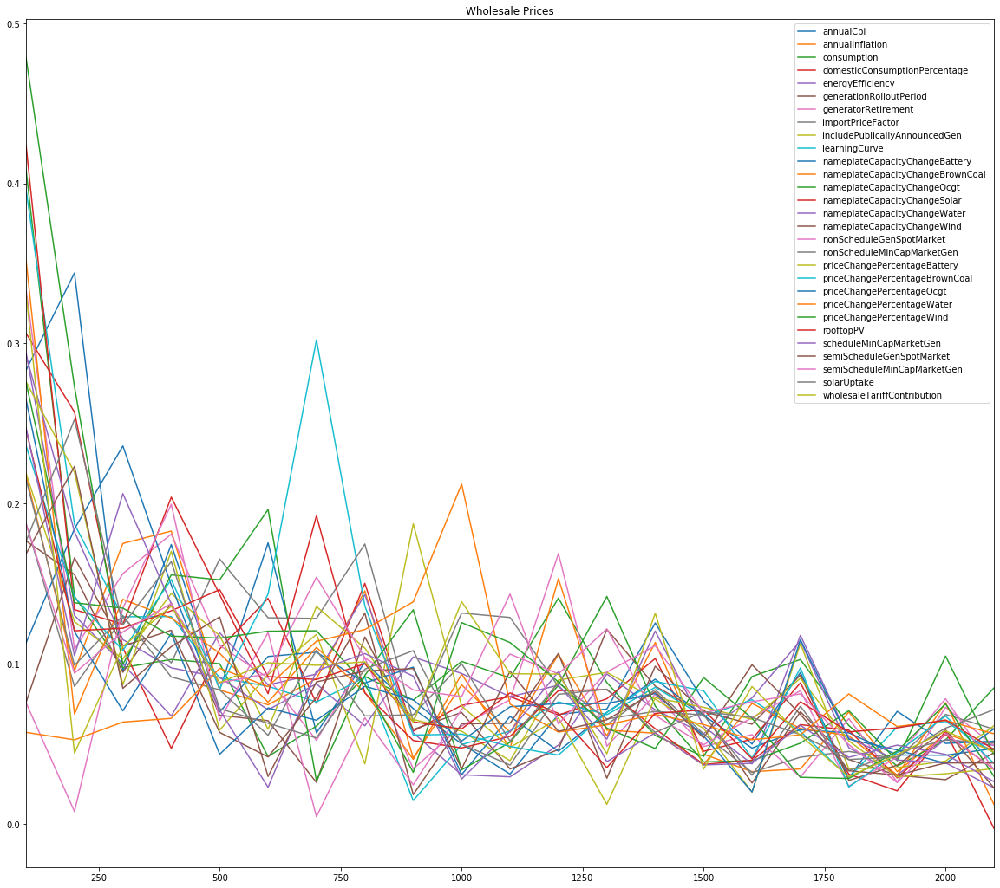

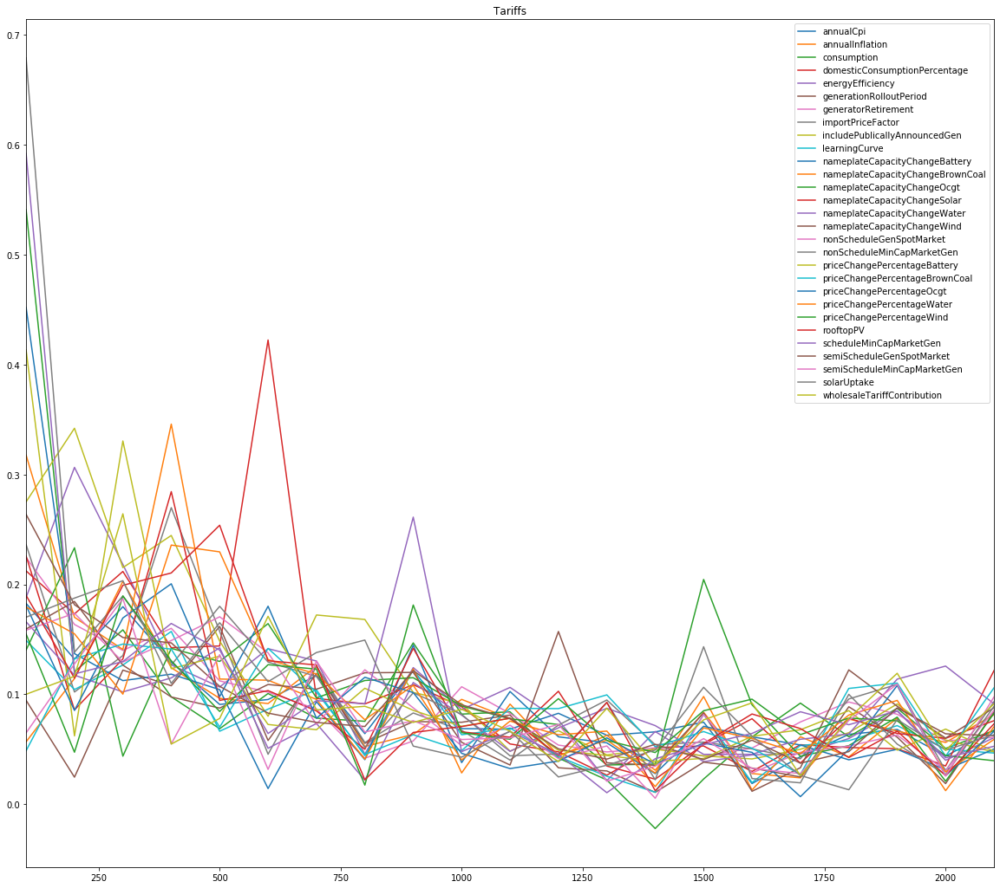

In [130]:
for ooi in outcomes_to_show:
    # multiple line plots
    s1_max_df = pd.DataFrame.from_dict(s1_max_ooi[ooi], orient='index')
   
    s1_max_df.plot(figsize=(20, 18),title=titles_ooi[ooi] )

    # show legend
    plt.legend()

    # show graph
    plt.show()

### ST Median

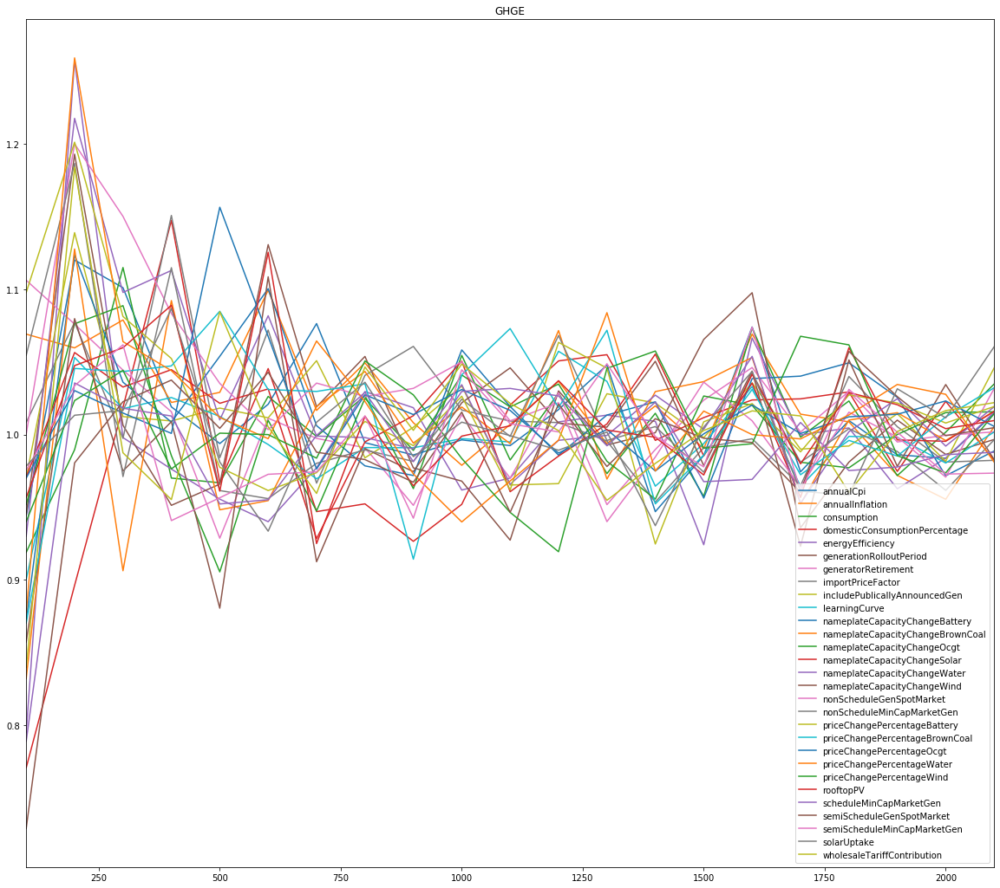

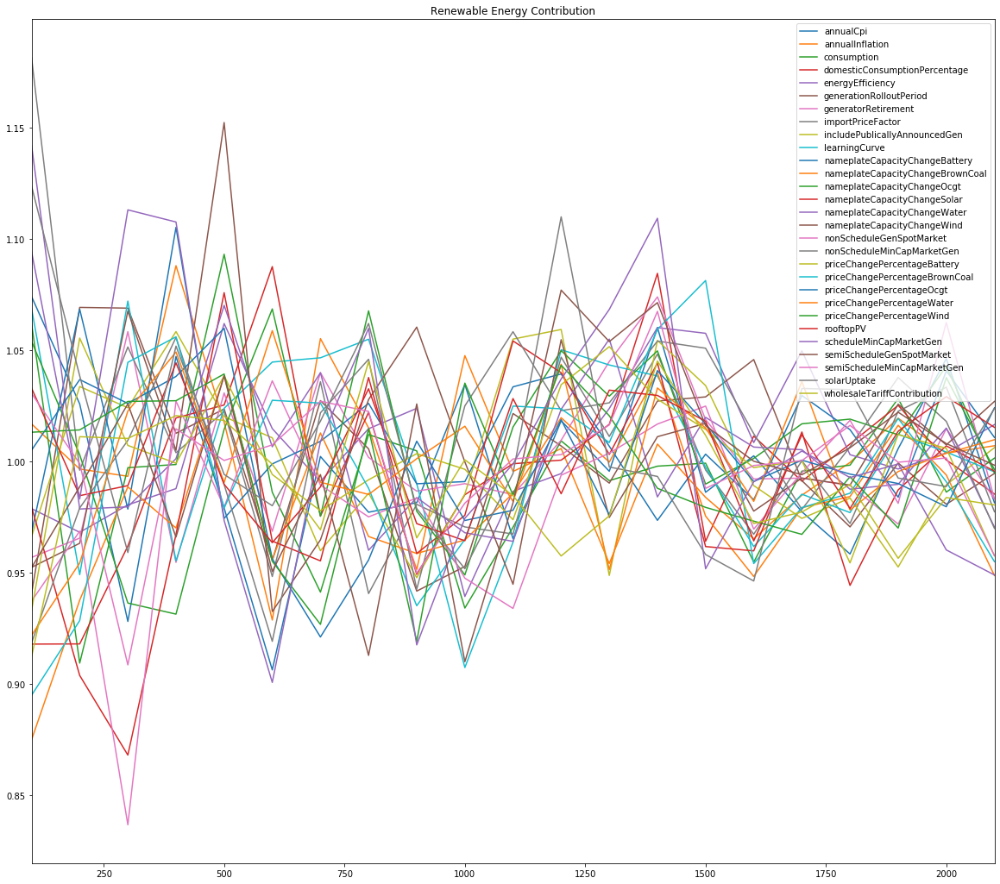

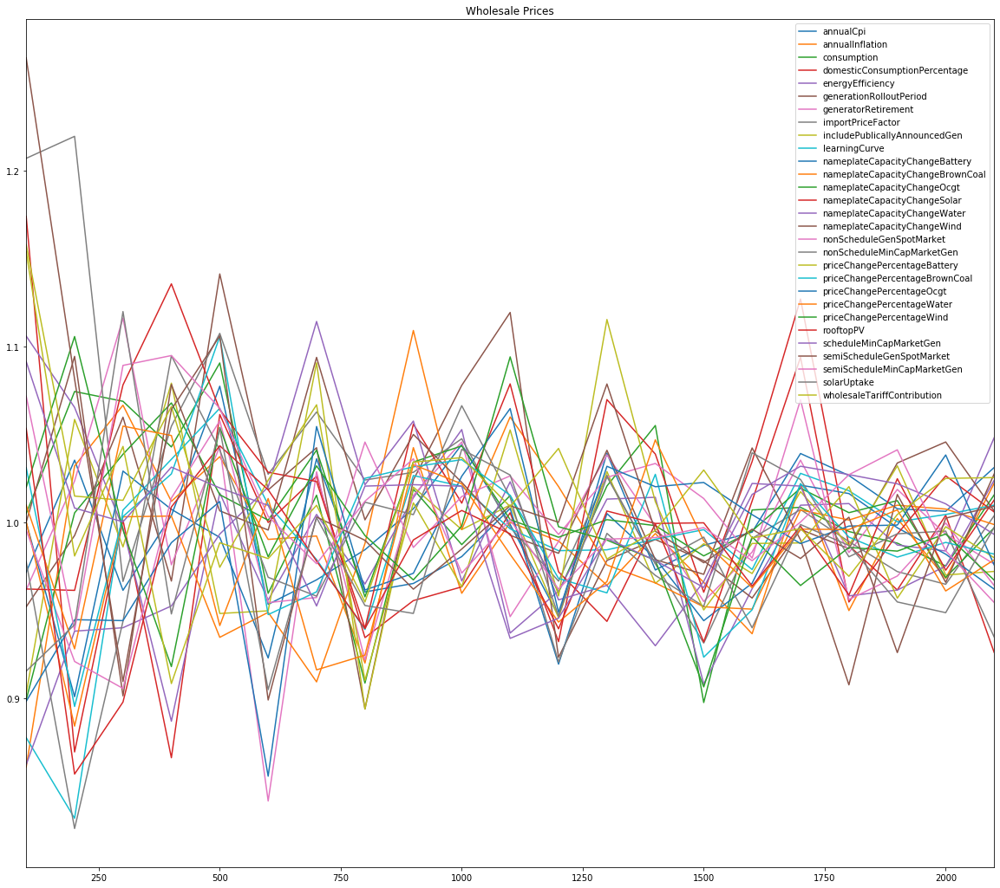

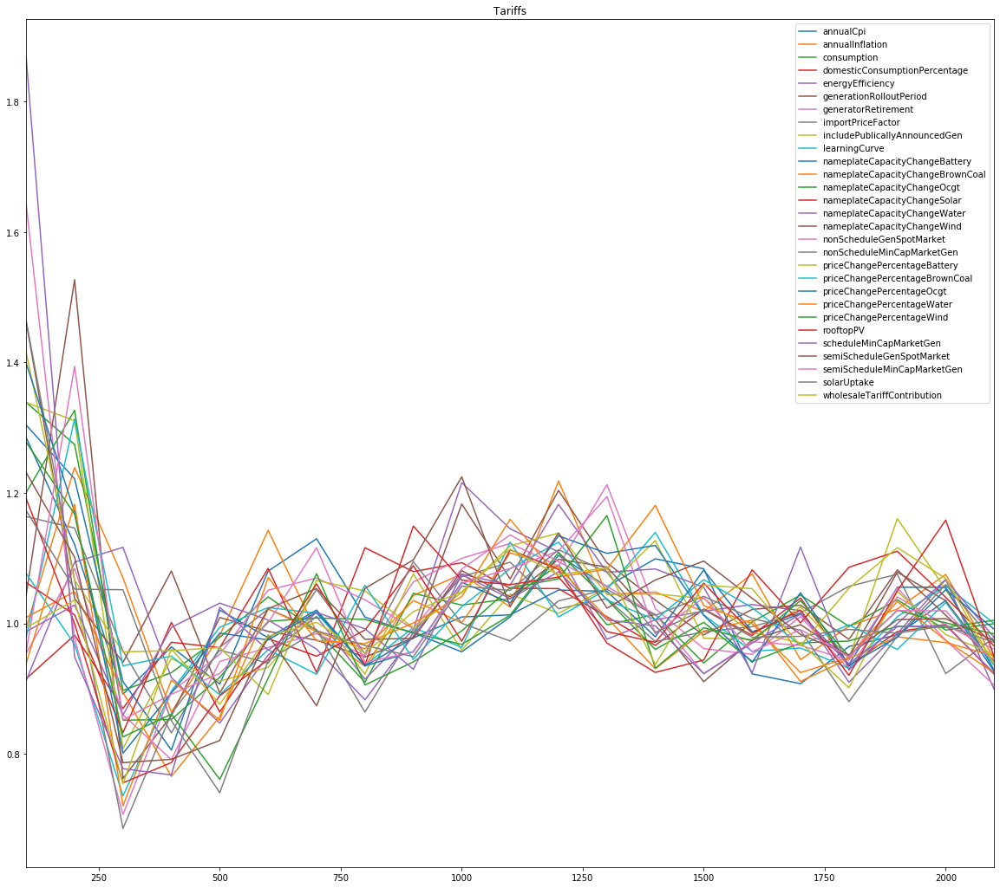

In [132]:

for ooi in outcomes_to_show:
    # multiple line plots
    st_med_df = pd.DataFrame.from_dict(st_median_ooi[ooi], orient='index')
   
    st_med_df.plot(figsize=(20, 18),title=titles_ooi[ooi] )

    # show legend
    plt.legend()

    # show graph
    plt.show()

### ST Max

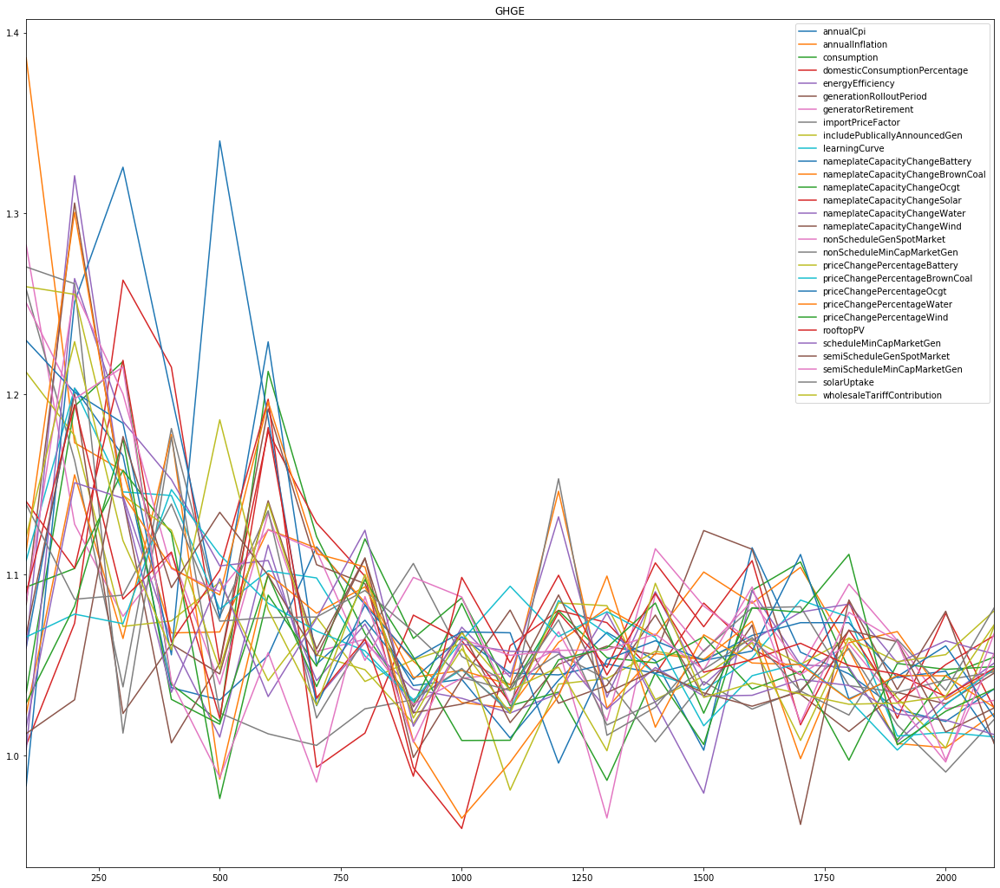

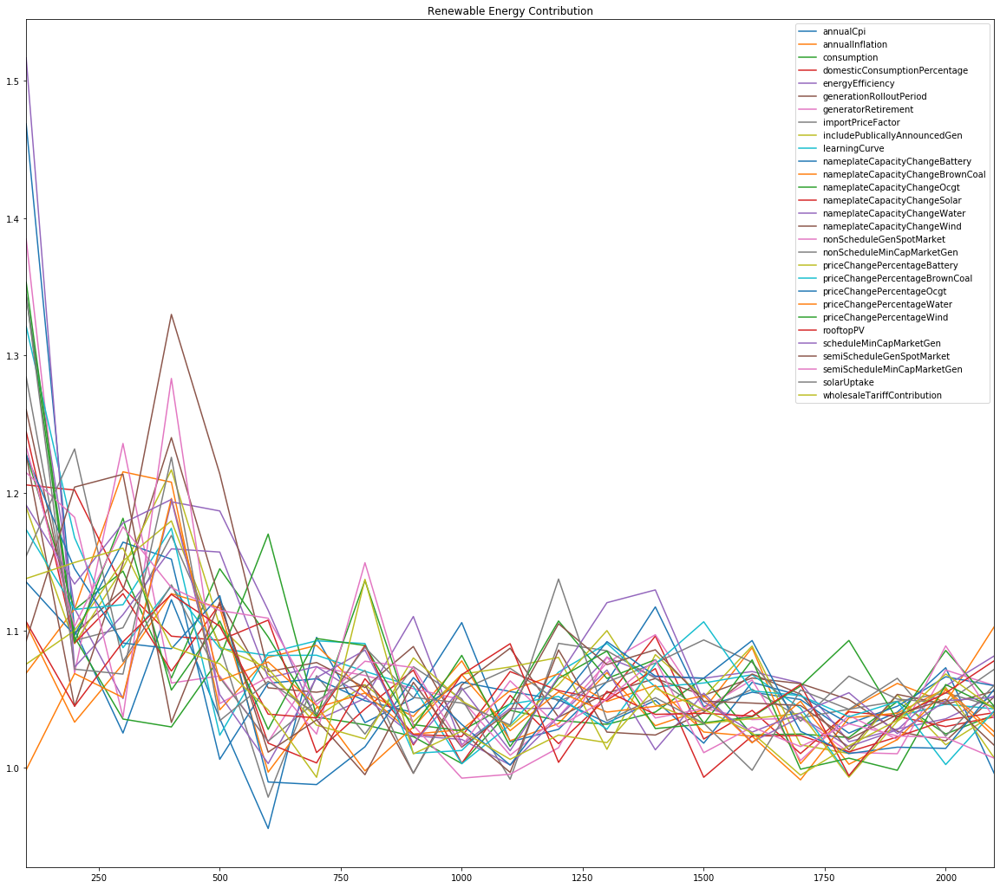

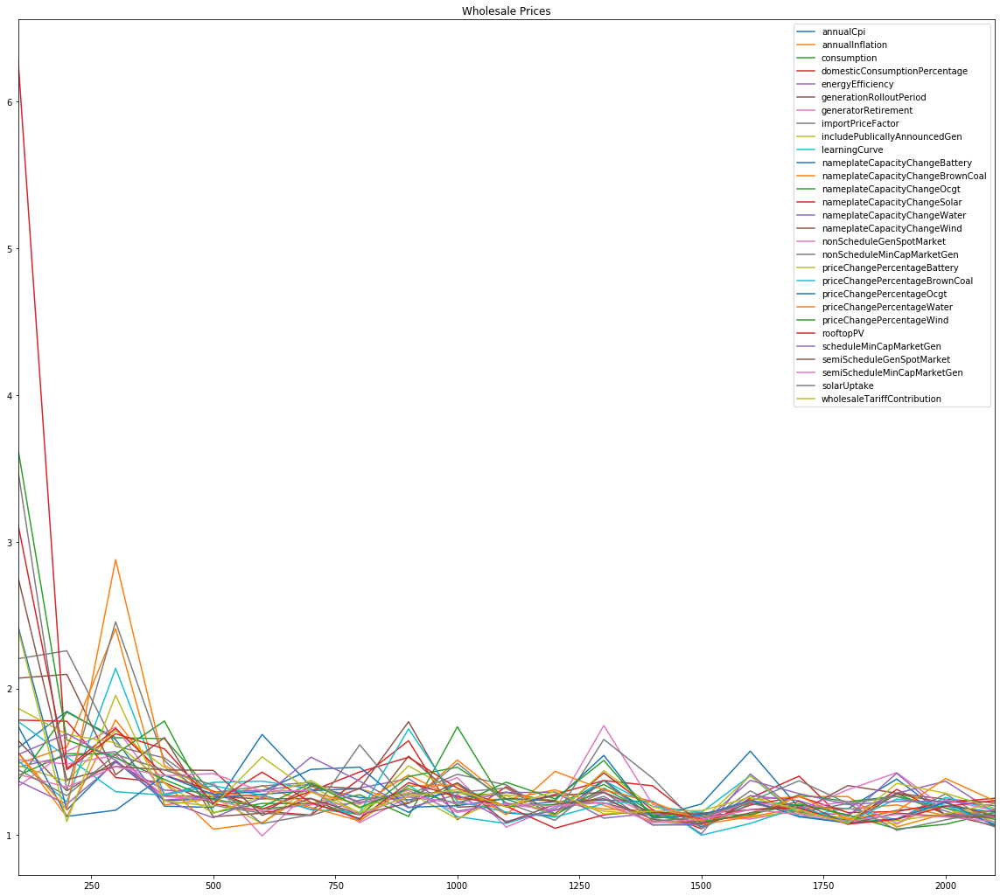

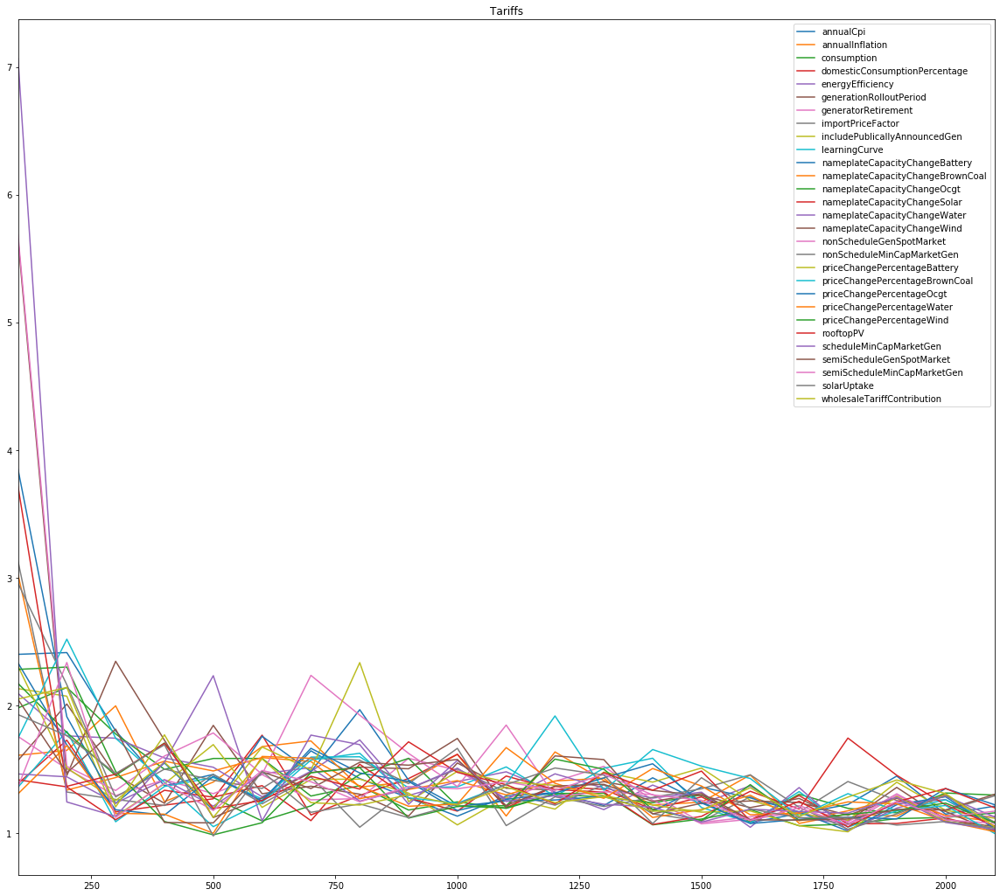

In [131]:

for ooi in outcomes_to_show:
    # multiple line plots
    st_max_df = pd.DataFrame.from_dict(st_max_ooi[ooi], orient='index')
   
    st_max_df.plot(figsize=(20, 18),title=titles_ooi[ooi] )

    # show legend
    plt.legend()

    # show graph
    plt.show()